<a href="https://colab.research.google.com/github/DolapoSalim/opencv-repo-learning/blob/main/Using_FathomNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import ipywidgets as widgets  # Provides embedded widgets
import ipyleaflet  # Provides map widgets
import requests  # Manages HTTP requests
import plotly.express as px  # Generates nice plots
import random  # Generates pseudo-random numbers
from PIL import Image, ImageFont, ImageDraw  # Facilitates image operations
from io import BytesIO  # Interfaces byte data

In [2]:
!pip install -q -U fathomnet ipyleaflet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 43.0 MB/s eta 0:00:00


In [10]:
from IPython import get_ipython
from IPython.display import display

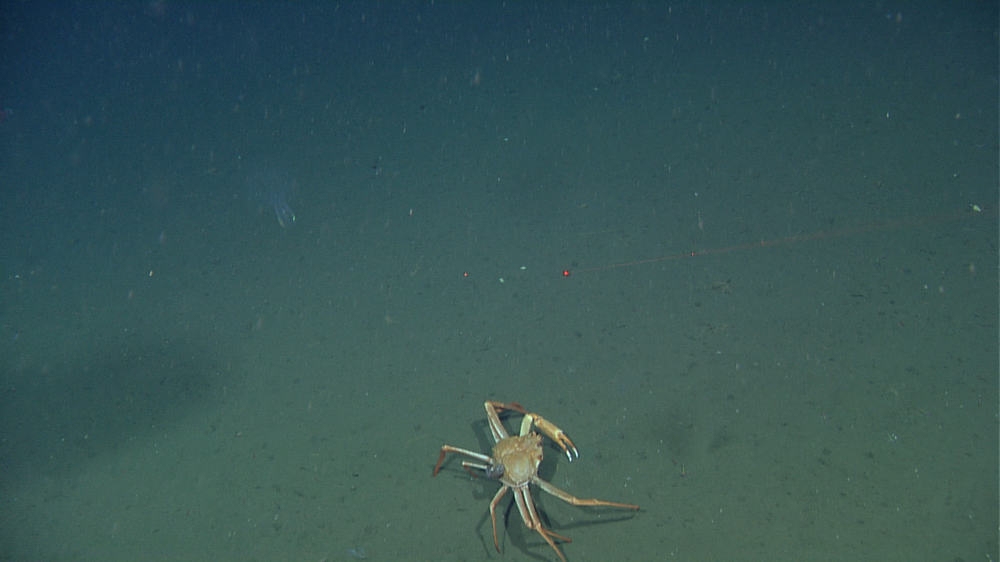

In [11]:
from fathomnet.api import images

sample_image = images.find_by_uuid('79958ac5-832a-488c-9b48-cce7db346497')

# Fetch the image bytes from the URL
image_url = sample_image.url
image_bytes = requests.get(image_url).content

# Convert the image data to a PIL Image object
image = Image.open(BytesIO(image_bytes))

# Display the image
display(image)

In [14]:
type(sample_image)

fathomnet.dto.AImageDTO

In [15]:
print("Image URL:", sample_image.url)

print("Captured at latitude/longitude", sample_image.latitude, sample_image.longitude)

print("There are", len(sample_image.boundingBoxes), "bounding boxes:")
for box in sample_image.boundingBoxes:
    print("-", box.concept, "has area", box.width * box.height)

Image URL: https://fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/0059/06_37_39_26.png
Captured at latitude/longitude 48.311961 -126.061859
There are 3 bounding boxes:
- Bolinopsis has area 32292
- Careproctus has area 1554
- Chionoecetes tanneri has area 147420


In [17]:
print(sample_image.to_json(indent=2))

{
  "id": null,
  "uuid": "79958ac5-832a-488c-9b48-cce7db346497",
  "url": "https://fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/0059/06_37_39_26.png",
  "valid": true,
  "imagingType": "ROV",
  "depthMeters": null,
  "height": 1080,
  "lastValidation": "2025-02-01T09:57:10.659127Z",
  "latitude": 48.311961,
  "longitude": -126.061859,
  "altitude": null,
  "salinity": 34.21099853515625,
  "temperatureCelsius": 4.315000057220459,
  "oxygenMlL": 0.2639999985694885,
  "pressureDbar": null,
  "mediaType": null,
  "modified": null,
  "sha256": "d270c68e1c19b5f15c9b3909739b837ce013a13ab404d5f0e48d38d8e30d58a9",
  "contributorsEmail": "brian@mbari.org",
  "tags": [
    {
      "id": null,
      "uuid": "4ad6d956-2359-42fd-bd47-f355a8e587c1",
      "key": "source",
      "mediaType": "text/plain",
      "value": "MBARI/VARS",
      "createdTimestamp": null,
      "lastUpdatedTimestamp": null,
      "image": null
    }
  ],
  "timestamp": "2009-08-05T21:05:42Z",
  "width": 1920,
  

In [18]:
from fathomnet.api import boundingboxes

# Make a bar chart of the top N concepts by bounding boxes
N = 5  # @param {type:"slider", min:5, max:20, step:1}

# Get the number of bounding boxes for all concepts
concept_counts = boundingboxes.count_total_by_concept()

# Sort by number of bounding boxes
concept_counts.sort(key=lambda cc: cc.count, reverse=True)

# Get the top N concepts and their counts
concepts, counts = zip(*((cc.concept, cc.count) for cc in concept_counts[:N]))

# Make a bar chart
fig = px.bar(
    x=concepts,
    y=counts,
    labels={"x": "Concept", "y": "Bounding box count"},
    title=f"Top {N} concepts",
    text_auto=True,
)
fig.show()

In [24]:
from fathomnet.api import boundingboxes

# Get a list of all concepts that have at least 1 bounding box
all_concepts = boundingboxes.find_concepts()

# Print how many there are
print("FathomNet has", len(concept_counts), "localized concepts!")

# Pick one!
concept_combo = widgets.Combobox(
    options=all_concepts,
    description="Pick one:",
    placeholder="Double-click or type here",
    ensure_option=True,
    disabled=False,
)
concept_combo

FathomNet has 2414 localized concepts!


Combobox(value='', description='Pick one:', ensure_option=True, options=('', '1-gallon paint bucket', '2G Robo…

In [29]:
from fathomnet.api import images

# Get the selected concept
selected_concept = concept_combo.value

# List the images FathomNet for that concept
concept_images = images.find_by_concept(selected_concept)

# Print the total number
print("Found", len(concept_images), "images of", selected_concept)

Found 8 images of Auloplax


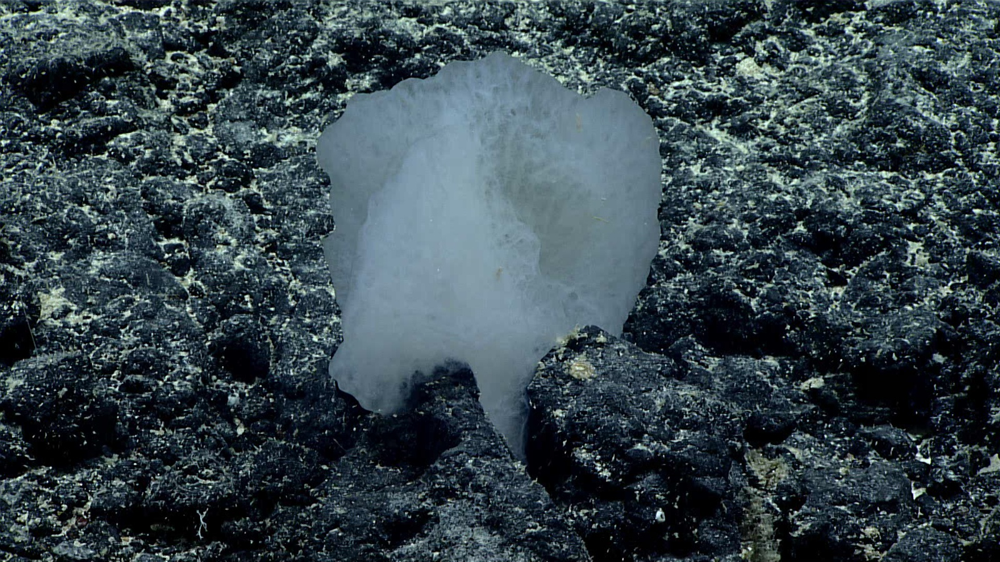

In [30]:
# Pick a random image
random_image = concept_images[random.randrange(len(concept_images))]

# Fetch and show the image
image_data = requests.get(random_image.url).content
pil_image = Image.open(BytesIO(image_data))
display(pil_image)

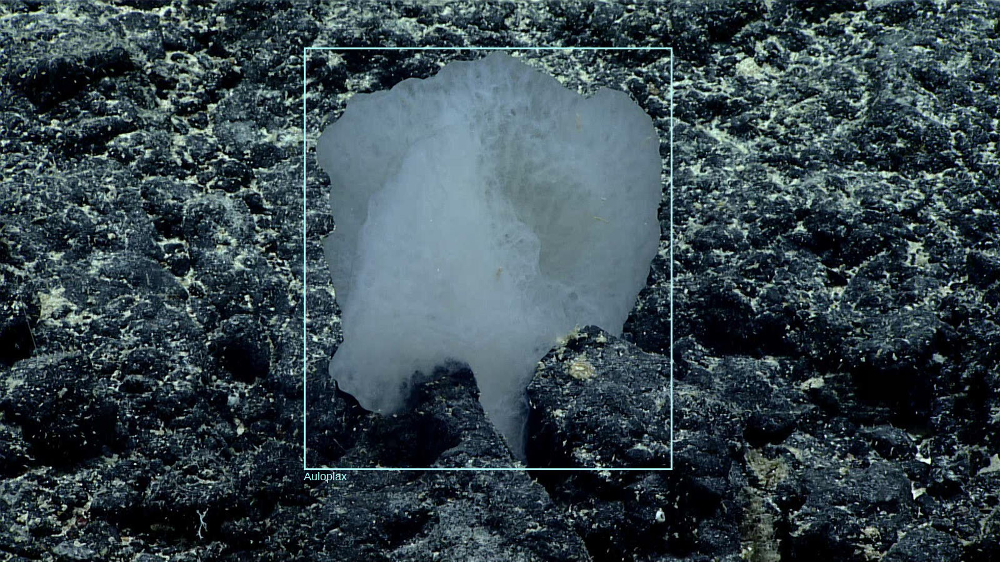

In [31]:
# Concept -> color mapping for bounding boxes
def color_for_concept(concept: str):
    hash = sum(map(ord, concept)) << 5
    return f"hsl({hash % 360}, 100%, 85%)"


# Draw the bounding boxes and labels on the image
draw_image = ImageDraw.Draw(pil_image)
font = ImageFont.truetype(
    "/usr/share/fonts/truetype/liberation/LiberationSans-Regular.ttf", size=18
)
for box in random_image.boundingBoxes:
    color = color_for_concept(box.concept)
    draw_image.rectangle(
        (box.x, box.y, box.x + box.width, box.y + box.height), width=3, outline=color
    )
    draw_image.text((box.x, box.y + box.height), box.concept, fill=color, font=font)

# Show the image with overlay
display(pil_image)

In [32]:
# Extract the latitude/longitude from each image
locations = [
    (image.latitude, image.longitude)
    for image in concept_images
    if image.latitude is not None and image.longitude is not None
]

# Create a map from the Esri Ocean basemap
center = (36.807, -121.988)  # Monterey Bay
map = ipyleaflet.Map(
    basemap=ipyleaflet.basemaps.Esri.OceanBasemap, center=center, zoom=10
)
map.layout.height = "800px"

# Overlay the image locations as a heatmap
heatmap = ipyleaflet.Heatmap(locations=locations, radius=20, min_opacity=0.5)
map.add_layer(heatmap)

map

Map(center=[36.807, -121.988], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zo…

In [33]:
!pip install -q -U fathomnet pycocotools pandas plotly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 87.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.8/14.8 MB 81.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.


In [37]:
!pip install pandas==2.2.2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 64.5 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.3
    Uninstalling pandas-2.2.3:
      Successfully uninstalled pandas-2.2.3


In [38]:
!pip install -q -U fathomnet pycocotools pandas plotly

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.


In [39]:
import matplotlib.pyplot as plt  # Plotting utilities
import requests  # Manages HTTP requests
import random  # Random number generator
import numpy as np  # Array manipulations
import pandas as pd  # More array manipulations
import plotly.express as px  # Plotting library

# Import coco dataset tools
from pycocotools.coco import COCO

# Import from pyplot and PIL for easy plotting
from PIL import Image
import skimage.io as io

In [40]:
from fathomnet.dto import GeoImageConstraints

In [41]:
gersemia_constraints = GeoImageConstraints(concept="Gersemia juliepackardae", limit=20)

In [42]:
from fathomnet.api import images

gersemia_images = images.find(gersemia_constraints)
print(f"Gersemia juliepackardae images: {len(gersemia_images)}")

Gersemia juliepackardae images: 20


In [43]:
import requests
from pathlib import Path
from progressbar import progressbar
from io import BytesIO

# Create a directory for the images
data_dir = Path("/content/gersemia_voc")
image_dir = data_dir / "JPEGImages"
image_dir.mkdir(exist_ok=True, parents=True)

# Download each image, saving each new file path to a list
image_paths = []
for image in progressbar(gersemia_images, redirect_stdout=True):
    # Format our image file name as the image UUID + .jpg
    image_path = image_dir / f"{image.uuid}.jpg"
    image_paths.append(image_path)
    if image_path.exists():  # Skip re-downloading images
        continue

    # Download the image
    image_raw = requests.get(image.url, stream=True).raw
    pil_image = Image.open(image_raw)

    # Convert to RGB (ensures consistent colorspace)
    pil_image = pil_image.convert("RGB")

    # Save the image
    pil_image.save(image_path)

100% (20 of 20) |########################| Elapsed Time: 0:00:11 Time:  0:00:11


In [44]:
xml_dir = data_dir / "Annotations"
xml_dir.mkdir(exist_ok=True, parents=True)

for image, image_path in zip(gersemia_images, image_paths):
    xml_path = xml_dir / image_path.with_suffix(".xml").name
    image.boundingBoxes = list(
        filter(  # filter only Gersemia juliepackardae
            lambda box: box.concept == "Gersemia juliepackardae", image.boundingBoxes
        )
    )
    pascal_voc = image.to_pascal_voc(path=str(image_path), pretty_print=True)
    xml_path.write_text(pascal_voc)

In [45]:
! fathomnet-generate

usage: fathomnet-generate [-h] [-v] [-t TAXA] [--contributor-email CONTRIBUTOR_EMAIL]
                          [--start START_TIMESTAMP] [--end END_TIMESTAMP]
                          [--imaging-types IMAGING_TYPES] [--exclude-unverified]
                          [--exclude-verified] [--min-longitude MIN_LONGITUDE]
                          [--max-longitude MAX_LONGITUDE] [--min-latitude MIN_LATITUDE]
                          [--max-latitude MAX_LATITUDE] [--min-depth MIN_DEPTH]
                          [--max-depth MAX_DEPTH] [--institutions OWNER_INSTITUTION_CODES] [-a]
                          [-f {voc,coco,yolo}] [--img-download IMG_DIR]
                          [-c CONCEPTS | --concepts-file CONCEPTS_FILE] (--count | -o OUTPUT)
fathomnet-generate: error: one of the arguments --count -o/--output is required


In [46]:
! fathomnet-generate -c "Aegina rosea" --count

concept      |  # boxes
-------------|---------
Aegina rosea |       29


In [47]:
! fathomnet-generate -c "Aegina rosea" --format coco --img-download 'demo_dataset/images' --output 'demo_dataset'

100% (29 of 29) |############################################| Elapsed Time: 0:00:16 Time:  0:00:16


In [48]:
# Create a coco dataset object
dataset = COCO("demo_dataset/dataset.json")

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [49]:
# Show all the categories names
cats = dataset.loadCats(dataset.getCatIds())
nms = [cat["name"] for cat in cats]
print("Categories: \n{}\n".format(" \n".join(nms)))

Categories: 
Aegina rosea



In [50]:
cats

[{'id': 1, 'name': 'Aegina rosea', 'supercategory': ''}]

In [51]:
cat_ids = dataset.getCatIds(catNms=nms)
for cid in cat_ids:
    anns = dataset.getAnnIds(catIds=cid)
    print(f"{cats[cid-1]['name']} has {len(anns)} annotations")

Aegina rosea has 29 annotations


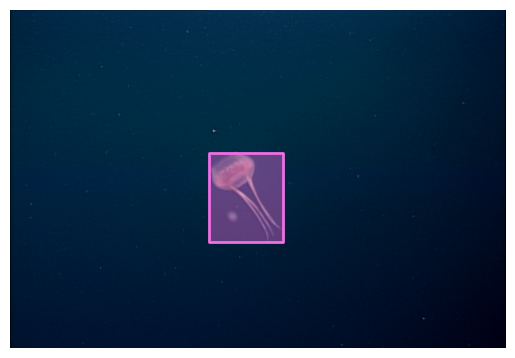

In [52]:
# Grab all the image ids associated with Aegina citrea
img_ids = dataset.getImgIds(catIds=cat_ids[0])

# Select one of them at random
img = dataset.loadImgs(img_ids[np.random.randint(0, len(img_ids))])[0]

# Get the annotations in the image
anns_ids = dataset.getAnnIds(imgIds=img["id"], catIds=cat_ids[0], iscrowd=None)
anns = dataset.loadAnns(anns_ids)

# ...and display it
im = io.imread(f"demo_dataset/images/{img['file_name']}")
plt.axis("off")
plt.imshow(im)
dataset.showAnns(anns, draw_bbox=True)

In [53]:
! fathomnet-generate --output 'demo_coco' --format coco \
    --max-latitude 37.0538 --min-latitude 36.4458 \
    --max-longitude -121.7805 --min-longitude -122.5073 \
    --start 2018-01-01 --end 2018-12-31

In [54]:
# Create a new coco dataset object
dataset = COCO("demo_coco/dataset.json")

loading annotations into memory...
Done (t=0.03s)
creating index...
index created!


In [55]:
# Look at some high level information.
print(f"Number of images = {len(dataset.getImgIds())}")
print(f"Number of annotations = {len(dataset.getAnnIds())}")
print(f"Number of categories = {len(dataset.getCatIds())}")

Number of images = 1228
Number of annotations = 1916
Number of categories = 154


In [56]:
all_anns = dataset.loadAnns(dataset.getAnnIds())
all_anns = pd.DataFrame(
    all_anns
)  # Make it into a pandas data frame for easy manipulation

# See what the most abundant category is
cid = all_anns["category_id"].value_counts().idxmax()
print(f"Most abundant category id = {cid}")

Most abundant category id = 50


In [57]:
dataset.loadCats(ids=[cid])[0]["name"]

'Eusergestes similis'

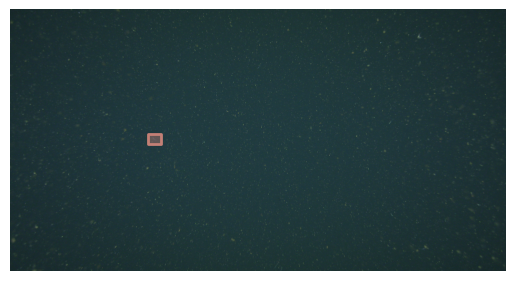

In [58]:
# Get all images that contain at least one annotation with that category id
img_ids = dataset.getImgIds(catIds=cid)

# Select one of them at random
img = dataset.loadImgs(img_ids[np.random.randint(0, len(img_ids))])[0]

# Get the annotations in the image
anns_ids = dataset.getAnnIds(imgIds=img["id"], catIds=cid, iscrowd=None)
anns = dataset.loadAnns(anns_ids)

# ...and display it
im = io.imread(img["coco_url"])  # this downloads the image
plt.axis("off")
plt.imshow(im)
dataset.showAnns(anns, draw_bbox=True)